<img src="https://github.com/RadimKozl/OpenCV_Project4/blob/832738cf629a0d6518297f860fd1952e3eaa3143/notebooks/img/OpenCV_logo.png" alt="OpenCV logo" style="width: 200px;"/>

###### <font size="10">Custom YOLO object detector, using a trained ONNX model using the Ultralytics library</font>

# Introduction

In this notebook we will demonstrate the use of the *.onnx model using the Ultralitics library.


<center><img src="../img/ultralitics-integrations.png" alt="ultralitics integrations" style="width: 800px;"/></center>

# Housekeeping

In [1]:
# !pip install opencv-python
# !pip install opencv-contrib-python
# !pip install opencv-python-headless
# !pip install opencv-contrib-python-headless
# !pip install ultralytics
# !pip install pillow

In [2]:
import os
os.chdir('C:\\Users\\kozl\\ITProjects\\DataScienciPython\\data_science_python_training\\lessons\\OpenCV\\lesson26\\coursework\\notebooks')

In [3]:
import cv2, sys, os, csv

import pickle

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

from dataPath import MODEL_PATH, IMAGES_PATH, RESULTS_PATH, PICKLE_PATH

import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual, IntSlider, Output
from ipywidgets.widgets.interaction import interactive
from IPython.display import display

from ultralytics import YOLO
from PIL import Image

%matplotlib inline

In [4]:
matplotlib.rcParams['figure.figsize'] = (8.0,8.0)
matplotlib.rcParams['image.cmap'] = 'gray'
matplotlib.rcParams['image.interpolation'] = 'bilinear'

### ***Defining the necessary paths***

In [5]:
# path to the model YOLOv10
path_model_dir = os.path.join(MODEL_PATH, 'onnx')
# path directory for load test images
path_images_dir = os.path.join(IMAGES_PATH, 'test_images')
# path directory for save results onnx model
path_results_dir = os.path.join(IMAGES_PATH, 'results', 'ultralytics')

### ***Loading ONNX model***

In [6]:
list_onnx_paths = {}
list_onnx_names = []

In [7]:
def load_onnx(path_dir):
    list_files = os.listdir(path_dir)
    list_onnx_files = [file for file in list_files if os.path.isfile(os.path.join(path_dir, file)) and file.endswith('.onnx')]
    return list_onnx_files

In [8]:
list_onnx_files = load_onnx(path_model_dir)
list_onnx_files

['YOLOv10m_FMD.onnx',
 'YOLOv5m_FMD.onnx',
 'YOLOv6m_FMD.onnx',
 'YOLOv7_FMD.onnx',
 'YOLOv8m_FMD.onnx',
 'YOLOv9m_FMD.onnx']

In [9]:
for file in list_onnx_files:
    name = str(file.split('.')[0])
    path = os.path.join(path_model_dir, file)
    list_onnx_paths[name] = path
    list_onnx_names.append(name)

In [10]:
list_onnx_paths

{'YOLOv10m_FMD': '..\\data\\models\\onnx\\YOLOv10m_FMD.onnx',
 'YOLOv5m_FMD': '..\\data\\models\\onnx\\YOLOv5m_FMD.onnx',
 'YOLOv6m_FMD': '..\\data\\models\\onnx\\YOLOv6m_FMD.onnx',
 'YOLOv7_FMD': '..\\data\\models\\onnx\\YOLOv7_FMD.onnx',
 'YOLOv8m_FMD': '..\\data\\models\\onnx\\YOLOv8m_FMD.onnx',
 'YOLOv9m_FMD': '..\\data\\models\\onnx\\YOLOv9m_FMD.onnx'}

In [11]:
list_onnx_names

['YOLOv10m_FMD',
 'YOLOv5m_FMD',
 'YOLOv6m_FMD',
 'YOLOv7_FMD',
 'YOLOv8m_FMD',
 'YOLOv9m_FMD']

In [12]:
def sel_onnx(name):
    data = (name, list_onnx_paths[name])
    file_path = os.path.join(PICKLE_PATH, 'sel_data.pkl')
    with open(file_path, 'wb') as f:  
        pickle.dump(data, f)
    return data

In [37]:
path_model = interact(sel_onnx, name=list_onnx_names);
path_model

interactive(children=(Dropdown(description='name', options=('YOLOv10m_FMD', 'YOLOv5m_FMD', 'YOLOv6m_FMD', 'YOL…

<function __main__.sel_onnx(name)>

In [50]:
with open(os.path.join(PICKLE_PATH, 'sel_data.pkl'), 'rb') as f:
    sel_data = pickle.load(f)

In [51]:
# Load the exported ONNX model
# note: Set task parameter as 'detect', 'segment', 'classify', 'pose', 'obb'
onnx_model = YOLO(sel_data[1], task='detect')

### ***Load images and detect results***

In [52]:
def detect(used_model, model_name, path_image, path_save_results):
    image_name = os.path.split(path_image)[1]
    only_name = image_name.split('.')[0]
    path_save = os.path.join(path_save_results, 'results_' + str(model_name) + '_' + str(image_name)) 
    path_save_data = os.path.join(path_save_results, 'results_' + str(model_name) + '_' + str(only_name) + '.csv')
    
    results = used_model(path_image)
    with open(path_save_data, mode='w', newline='') as file:
        writer = csv.writer(file)
        for result in results:
            # Uložení výsledného obrázku s detekcemi
            result.save(path_save)
            for box in result.boxes:
                x1, y1, x2, y2 = box.xyxy[0].tolist()
                x1, y1, x2, y2 = float(x1), float(y1), float(x2), float(y2)
                confidence = box.conf[0].item() 
                class_id = box.cls[0].item() 
                writer.writerow([x1, y1, x2, y2, confidence, class_id])

In [53]:
def load_images(path_dir):
    list_files = os.listdir(path_dir)
    list_jpg_files = [file for file in list_files if os.path.isfile(os.path.join(path_dir, file)) and file.endswith('.jpg')]
    return list_jpg_files

In [54]:
# Run inference
list_samples = load_images(path_images_dir)

for sample in list_samples:
    print('\n',sample)
    path = os.path.join(path_images_dir, sample)
    results = detect(onnx_model, sel_data[0], path, path_results_dir)


 test-image1.jpg
Loading ..\data\models\onnx\YOLOv9m_FMD.onnx for ONNX Runtime inference...

image 1/1 C:\Users\kozl\ITProjects\DataScienciPython\data_science_python_training\lessons\OpenCV\lesson26\coursework\notebooks\..\data\images\test_images\test-image1.jpg: 640x640 1 mask, 331.9ms
Speed: 0.0ms preprocess, 331.9ms inference, 14.0ms postprocess per image at shape (1, 3, 640, 640)

 test-image2.jpg

image 1/1 C:\Users\kozl\ITProjects\DataScienciPython\data_science_python_training\lessons\OpenCV\lesson26\coursework\notebooks\..\data\images\test_images\test-image2.jpg: 640x640 4 masks, 1 no-mask, 203.9ms
Speed: 0.0ms preprocess, 203.9ms inference, 11.6ms postprocess per image at shape (1, 3, 640, 640)

 test-image3.jpg

image 1/1 C:\Users\kozl\ITProjects\DataScienciPython\data_science_python_training\lessons\OpenCV\lesson26\coursework\notebooks\..\data\images\test_images\test-image3.jpg: 640x640 17 masks, 1 no-mask, 205.0ms
Speed: 0.0ms preprocess, 205.0ms inference, 0.0ms postproces

### ***View Results***

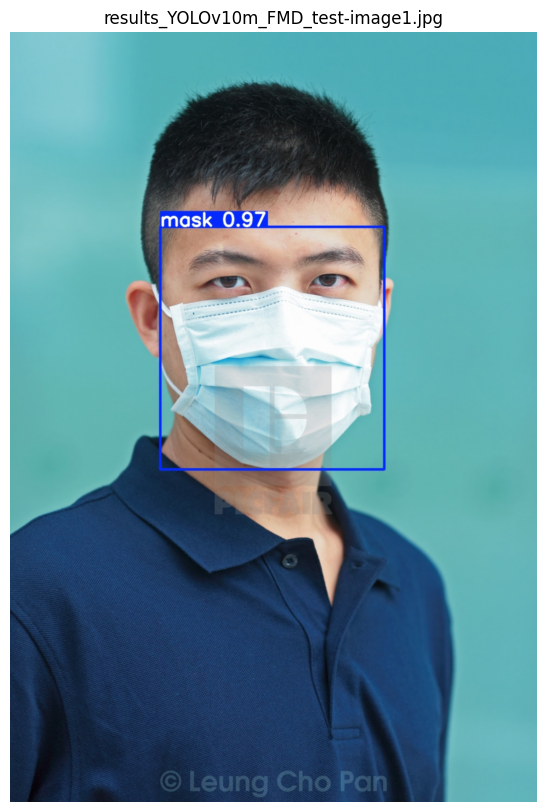

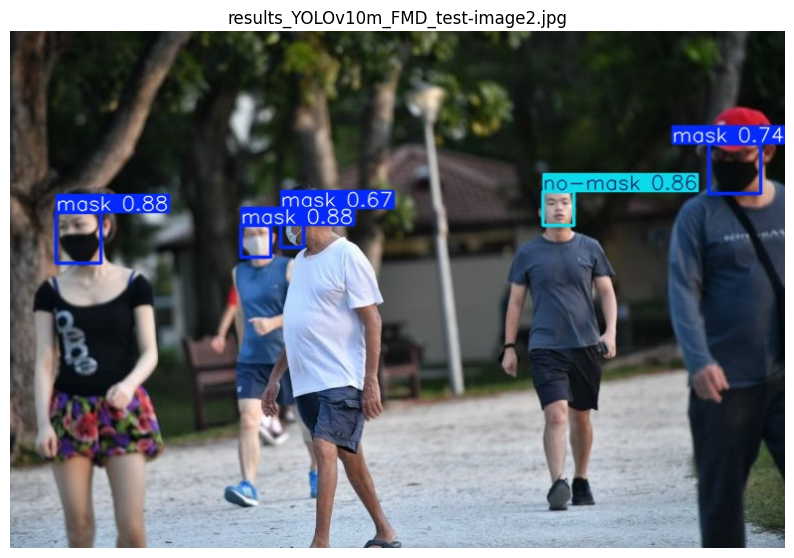

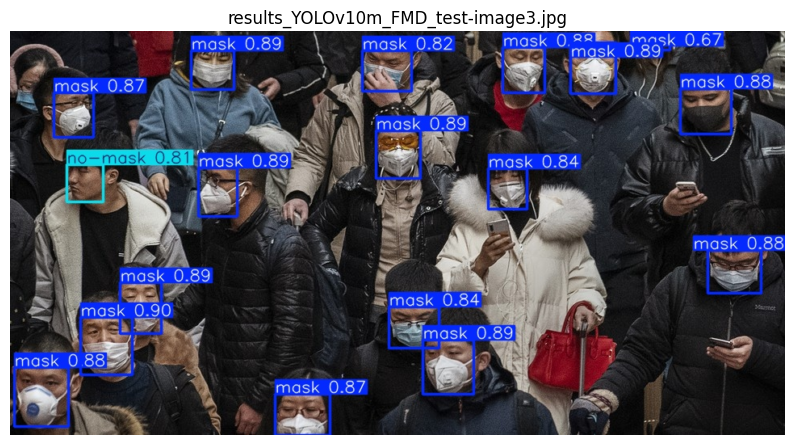

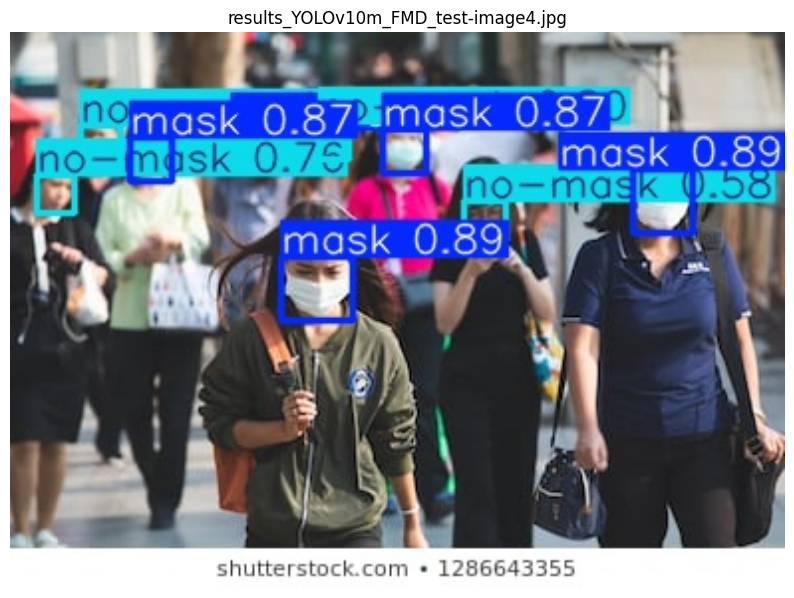

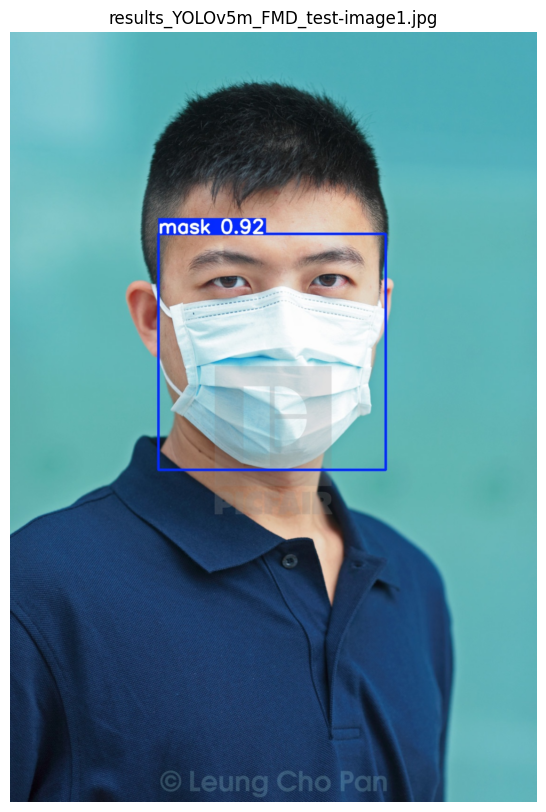

...

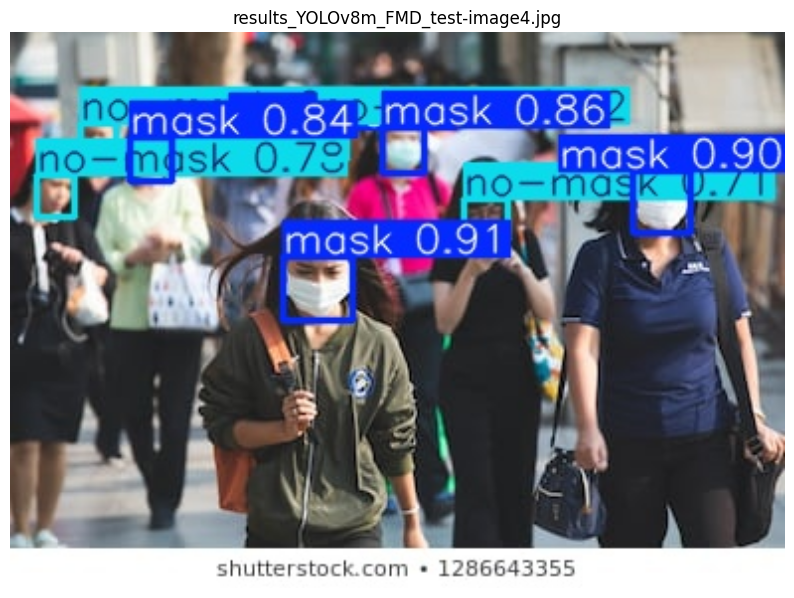

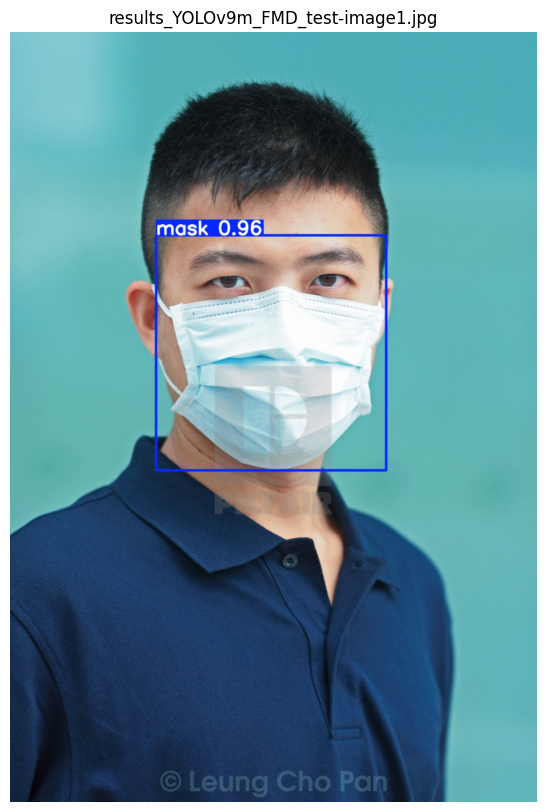

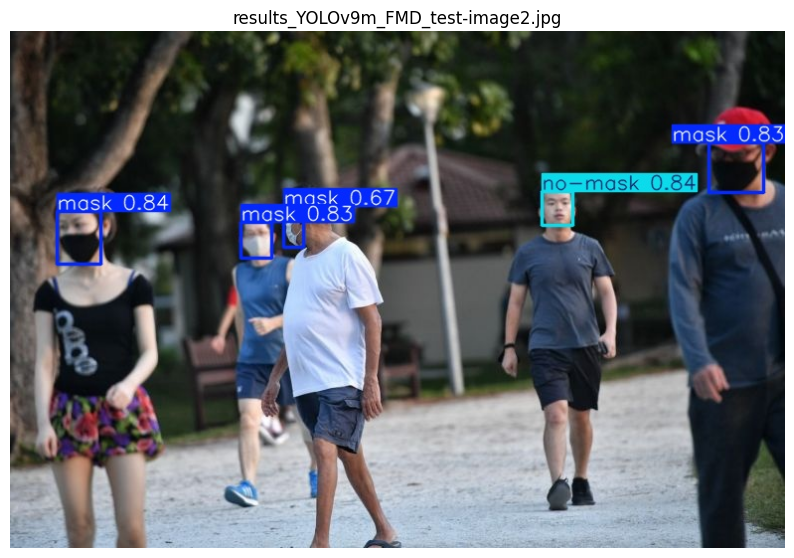

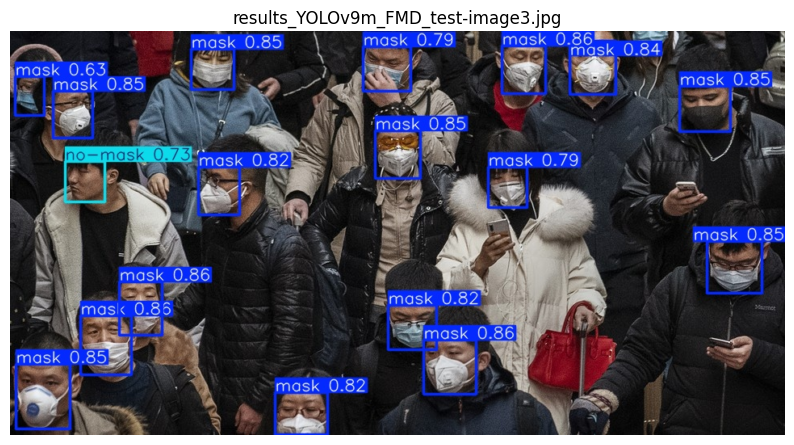

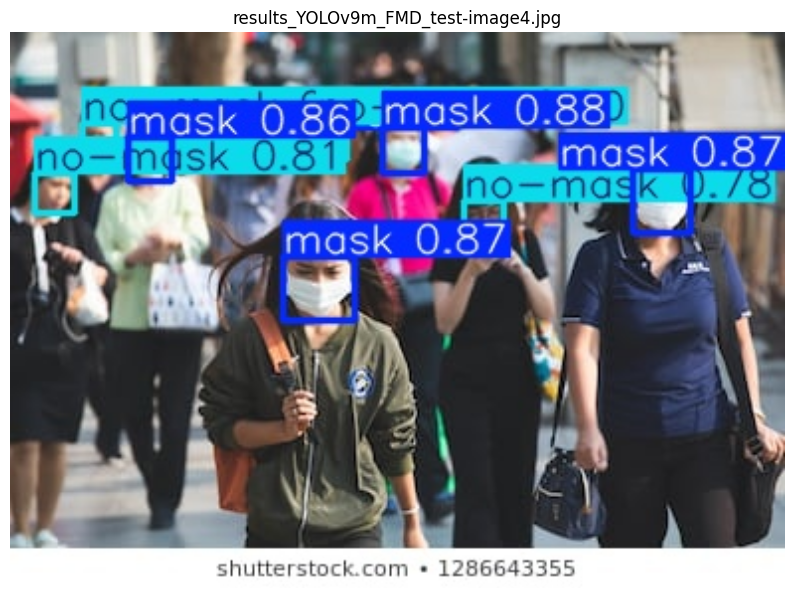

In [55]:
list_results = load_images(path_results_dir)

for result in list_results:
    path = os.path.join(path_results_dir, result)
    image = cv2.imread(path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.title(result)
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.show()

Note: for each image a *.csv file is created from the data `x1, y1, x2, y2, confidence, class_id`

## References and other materials

[ONNX Export for YOLOv8 Models](https://docs.ultralytics.com/integrations/onnx/)

[Model Export with Ultralytics YOLO](https://docs.ultralytics.com/modes/export/#introduction)

[Model Training with Ultralytics YOLO](https://docs.ultralytics.com/modes/train/)